This notebook generates Fig. 5.

In [1]:
# Disable warning
import warnings
warnings.filterwarnings('ignore')

# Import GDP drifter data

In [2]:
# import numpy
import numpy as np
# import datetime
from datetime import datetime

# get parent directory of working directory
import os
parentdirectory = os.path.dirname(os.getcwd())

# Import pandas
import pandas as pd

# get data directory where preprocesed GDP drifter data is stored.
# All the GDP drifters which were continuously active from the 04/10/2006 to the 04/11/2006 are stored in this directory.
data_directory = parentdirectory+"/data/GDP/Drifter_processed"

drifters = []

for r, d, f in os.walk(data_directory):
    # r=root, d=directories, f = files
    for file in f:
        if file.endswith(".csv"):
            csv_file = pd.read_csv(r+"/"+file).values
            time_string = csv_file[:,0]
            time_datetime = [datetime.strptime(s, '%Y-%m-%d %H:%M:%S') for s in time_string]
            time_seconds = [0]
            for i in range(len(time_datetime)-1):
                time_seconds.append(int((time_datetime[i+1]-time_datetime[0]).total_seconds()))
            longitude = csv_file[:,1]
            latitude = csv_file[:,2]
            drifters.append([time_seconds, longitude, latitude])

# Import MERIS data

In [3]:
# import netCDF4
from netCDF4 import Dataset, num2date

def import_nc(coor_file, name, geo = False):
    
    if geo:
        
        fileobj = Dataset(coor_file, 'r')
        lat = fileobj.variables['latitude'][:,:]
        long = fileobj.variables['longitude'][:,:]
        return long, lat
    
    else:
        
        fileobj = Dataset(coor_file, 'r')
        M_radiance = fileobj.variables[name][:,:]
        return M_radiance

In [4]:
# import Meris data
long, lat = import_nc(parentdirectory + r'/data/GDP/Sargassum/10_04_2006/geo_coordinates.nc', None, True)
M8 = import_nc(parentdirectory + r'/data/GDP/Sargassum/10_04_2006/M08_radiance.nc', 'M08_radiance')
M9 = import_nc(parentdirectory + r'/data/GDP/Sargassum/10_04_2006/M09_radiance.nc', 'M09_radiance')
M10 = import_nc(parentdirectory + r'/data/GDP/Sargassum/10_04_2006/M10_radiance.nc','M10_radiance')
M13 = import_nc(parentdirectory + r'/data/GDP/Sargassum/10_04_2006/M13_radiance.nc','M13_radiance')

# MCI = Maximum Chlorophyl Index
MCI = M9 - M8 - (709 - 681) * (M10 - M8) / (754 - 681)

x_Sargassum, y_Sargassum, Sargassum = [], [], []
for i in range(0, long.shape[0]):
    for j in range(0, lat.shape[1]):
        if MCI[i, j] != np.nan:
            if -72.5 < long[i,j] < -65 and 32.5 < lat[i,j] < 40:
                x_Sargassum.append(long[i, j])
                y_Sargassum.append(lat[i, j])
                
                # only consider measurements where cloud coverage is sufficient (M13>7.5)
                if M13[i, j] > 7.5:
                    Sargassum.append(np.nan)
                else:
                    Sargassum.append(MCI[i, j])

# Set MCI values which are greater than 0 to 0
Sargassum = np.array(Sargassum)
Sargassum[Sargassum > 0] = 0

# Compute TRA, Trajectory Length and Loopers

In [5]:
# import function to compute TRA
from ipynb.fs.defs.TRA import __TRA__

# import function to compute length of trajectory
from ipynb.fs.defs.Trajectory_Length import __Trajectory_length__

# import function to extract Loopers
from ipynb.fs.defs.Loopers import __Loopers__

TRA, Length, Loopers, long, lat = [], [], [], [], []
long_final, lat_final = [], []
long_init, lat_init = [], []

# Domain boundaries
long_min = -72.5
long_max = -65
lat_min = 32.5
lat_max = 40

# iterate over all drifters:
for d in drifters:
    
    # time
    time = d[0]
    #longitudinal position of drifter d
    longitude = d[1]
    # latitudinal position of drifter d
    latitude = d[2]
    # TRA associated to drifter d over the time d[0]
    f = 4
    
    # Trajectory length
    Length.append(__Trajectory_length__(longitude, latitude, time, f))
    # TRA
    TRA.append(__TRA__(longitude, latitude, time, f))
    # Loopers
    Loopers.append(__Loopers__(longitude, latitude, time, f, long_min, long_max, lat_min, lat_max))
    
    # Append longitude/latitude
    long.append(longitude)
    lat.append(latitude)
    
    # store final position
    long_final.append(longitude[-1])
    lat_final.append(latitude[-1])
    
    # store initial position
    long_init.append(longitude[0])
    lat_init.append(latitude[0])

In [6]:
from scipy.io import savemat
mat = {"TRA": TRA, "long": np.array(long), "lat": np.array(lat)}

savemat("drifter_GDP.mat", mat)

# Interpolate data from scattered grid to regular meshgrid using rbf-interpolation

In [7]:
# import scipy
from scipy import ndimage, misc
from metpy.interpolate import interpolate_to_grid

from tqdm.notebook import tqdm

# interpolation
def interpolation(x, y, TRA, resolution, x_min, x_max, y_min, y_max, interp_type, s = 10**(-10), kernel_size_deg = 0.25):
    
    # interpolate scattered interpolant to a grid
    X, Y, interp = interpolate_to_grid(x, y, TRA, interp_type, rbf_func = 'linear', rbf_smooth = s, hres=resolution)
    
    # transform size of spatial average filter from degrees to resolution of hte plot
    size = int(kernel_size_deg/res_interpolation)
    
    # spatial average filter of size
    interpolated_field_filter = interp.copy()

    # this spatial averaging filtering step is the same as cv2.blur except that it can additionally deal with nan-values.
    for i in tqdm(range(interp.shape[0])):
        for j in range(interp.shape[1]):
            if np.isnan(interp[i,j]) == False:
                # if all the values in the array are NaN, then it outputs RuntimeWarning and correctly returns NaN (the mean of NaN is NaN)
                # In order to avoid this, I suppress the warning as this is the most efficient way of dealing with NaN values.
                # This does not affect the results
                with warnings.catch_warnings():
                    warnings.simplefilter("ignore", category=RuntimeWarning)
                    interpolated_field_filter[i,j] = np.nanmean(interp[(i-int(size/2)):(i+int(size/2)+1), (j-int(size/2)):(j+int(size/2)+1)].ravel())
            else:
                interpolated_field_filter[i,j] = np.nan
    
    # Limits interpolation to domain boundaries
    idx_x_min = max(np.searchsorted(X[0,:], x_min)-1, 0)
    idx_x_max = np.searchsorted(X[0,:], x_max)
    
    idx_y_min = max(np.searchsorted(Y[:,0], y_min)-1, 0)
    idx_y_max = np.searchsorted(Y[:,0], y_max)
    
    interpolated_field = interpolated_field_filter[idx_y_min:idx_y_max+1, idx_x_min:idx_x_max+1].copy()
    
    return X[idx_y_min:idx_y_max+1, idx_x_min:idx_x_max+1], Y[idx_y_min:idx_y_max+1, idx_x_min:idx_x_max+1], interpolated_field

# resolution of scattered interpolation
res_interpolation = 0.05

# scattered linear rbf-interpolation
X, Y, TRA_rbf = interpolation(long_final, lat_final, TRA, res_interpolation, long_min, long_max, lat_min, lat_max, interp_type = "rbf", kernel_size_deg = 0.25)

# scattered linear rbf-interpolation for Trajectory Length
X, Y, Length_rbf = interpolation(long_final, lat_final, Length, res_interpolation, long_min, long_max, lat_min, lat_max, interp_type = "rbf", kernel_size_deg = 0.25)

  0%|          | 0/1720 [00:00<?, ?it/s]

  0%|          | 0/1720 [00:00<?, ?it/s]

# Compute local extrema of TRA/Trajectory length

In [8]:
# Import numpy
import numpy as np

# Import fast scientific computing library
from numba import njit, prange

# Import math tools
from math import sqrt

def _loc_max(min_distance, X, Y, Field, loc_threshold = 0):
    
    # find local maxima
    peak_x, peak_y, peak_field, peak_idx_x, peak_idx_y = _find_reduced_set_of_local_maxima(min_distance, X, Y, Field, loc_threshold)
    
    # sort local maxima in descending order
    arg_index = np.argsort(peak_field)
    
    # x,y-position of local maximum
    peak_x = np.flip([peak_x[i] for i in arg_index])
    peak_y = np.flip([peak_y[i] for i in arg_index])
    
    # i,j-index of local maximum
    peak_idx_x = np.flip([peak_idx_x[i] for i in arg_index])
    peak_idx_y = np.flip([peak_idx_y[i] for i in arg_index])
    
    # value of local maximum
    peak_field = np.flip([peak_field[i] for i in arg_index])
    
    return peak_idx_x, peak_idx_y, peak_x, peak_y, peak_field

@njit()
def _find_all_local_maxima(X, Y, Field):
            
    loc_max_x, loc_max_y, loc_max_field = [], [], []
    idx_x, idx_y = [], []
            
    for i in range(2, X.shape[0]-2):
                
        for j in range(2, Y.shape[1]-2):
                    
            if np.isfinite(Field[i, j]) and Field[i, j] > Field[i+1, j] and Field[i, j] > Field[i-1, j] and Field[i, j] > Field[i, j+1] and Field[i, j] > Field[i, j-1]:
                        
                loc_max_x.append(X[i, j])
                loc_max_y.append(Y[i, j])
                loc_max_field.append(Field[i, j])
                idx_x.append(j)
                idx_y.append(i)
            
    return idx_x, idx_y, loc_max_x, loc_max_y, loc_max_field

@njit()
def _find_reduced_set_of_local_maxima(min_distance, X, Y, Field, loc_threshold):
    
    idx_x, idx_y, loc_max_x, loc_max_y, loc_max_field = _find_all_local_maxima(X, Y, Field)
    
    n_loc_max = len(loc_max_x)
        
    peak_x, peak_y, peak_field = [], [], []
    peak_idx_x, peak_idx_y = [], []
        
    for i in range(n_loc_max):
            
        bool_loc_max = True
    
        for j in range(n_loc_max):
            
            if i != j and loc_max_field[i] < loc_max_field[j] and sqrt((loc_max_x[i]-loc_max_x[j])**2+(loc_max_y[i]-loc_max_y[j])**2) <= min_distance:
                    
                bool_loc_max = False
                
        if bool_loc_max and loc_max_field[i] > loc_threshold:
                
            peak_x.append(loc_max_x[i])
            peak_y.append(loc_max_y[i])
            peak_field.append(loc_max_field[i])
            peak_idx_x.append(idx_x[i])
            peak_idx_y.append(idx_y[i])
            
    return peak_x, peak_y, peak_field, peak_idx_x, peak_idx_y

peak_x_TRA, peak_y_TRA, peak_TRA = _loc_max(0, X, Y, TRA_rbf, 0)[2:]
peak_x_M, peak_y_M, peak_M = _loc_max(0, X, Y, Length_rbf, 0)[2:]

# Extract vortices from $ \overline{TRA} $

In [9]:
# import vortex extraction algorithm
from ipynb.fs.defs.extract_vortex import __extract_vortex__

# resolution of scalar field for interpolation
resolution = res_interpolation

# threshold to local maximum
# As we only have one local maximum in the domain, we could actually set this also to 0.
threshold_loc_max = .5*np.nanmax(TRA_rbf)

# number of drifters inside the vortex
N_drifters = 2 #

long_vortex, lat_vortex, _ = __extract_vortex__(X, Y, TRA_rbf, long_final, lat_final, threshold_loc_max, N_drifters)

In [10]:
np.save("Sargassum_vortex.npy", [long_vortex, lat_vortex])

##### Define colormapping equivalent to MATLAB 'parula' (This is a hidden cell as it does not influence the computations)

In [11]:
# Define colormapping 'parula'
from matplotlib.colors import LinearSegmentedColormap
cm_data = [[0.2422, 0.1504, 0.6603],
[0.2444, 0.1534, 0.6728],
[0.2464, 0.1569, 0.6847],
[0.2484, 0.1607, 0.6961],
[0.2503, 0.1648, 0.7071],
[0.2522, 0.1689, 0.7179],
[0.254, 0.1732, 0.7286],
[0.2558, 0.1773, 0.7393],
[0.2576, 0.1814, 0.7501],
[0.2594, 0.1854, 0.761],
[0.2611, 0.1893, 0.7719],
[0.2628, 0.1932, 0.7828],
[0.2645, 0.1972, 0.7937],
[0.2661, 0.2011, 0.8043],
[0.2676, 0.2052, 0.8148],
[0.2691, 0.2094, 0.8249],
[0.2704, 0.2138, 0.8346],
[0.2717, 0.2184, 0.8439],
[0.2729, 0.2231, 0.8528],
[0.274, 0.228, 0.8612],
[0.2749, 0.233, 0.8692],
[0.2758, 0.2382, 0.8767],
[0.2766, 0.2435, 0.884],
[0.2774, 0.2489, 0.8908],
[0.2781, 0.2543, 0.8973],
[0.2788, 0.2598, 0.9035],
[0.2794, 0.2653, 0.9094],
[0.2798, 0.2708, 0.915],
[0.2802, 0.2764, 0.9204],
[0.2806, 0.2819, 0.9255],
[0.2809, 0.2875, 0.9305],
[0.2811, 0.293, 0.9352],
[0.2813, 0.2985, 0.9397],
[0.2814, 0.304, 0.9441],
[0.2814, 0.3095, 0.9483],
[0.2813, 0.315, 0.9524],
[0.2811, 0.3204, 0.9563],
[0.2809, 0.3259, 0.96],
[0.2807, 0.3313, 0.9636],
[0.2803, 0.3367, 0.967],
[0.2798, 0.3421, 0.9702],
[0.2791, 0.3475, 0.9733],
[0.2784, 0.3529, 0.9763],
[0.2776, 0.3583, 0.9791],
[0.2766, 0.3638, 0.9817],
[0.2754, 0.3693, 0.984],
[0.2741, 0.3748, 0.9862],
[0.2726, 0.3804, 0.9881],
[0.271, 0.386, 0.9898],
[0.2691, 0.3916, 0.9912],
[0.267, 0.3973, 0.9924],
[0.2647, 0.403, 0.9935],
[0.2621, 0.4088, 0.9946],
[0.2591, 0.4145, 0.9955],
[0.2556, 0.4203, 0.9965],
[0.2517, 0.4261, 0.9974],
[0.2473, 0.4319, 0.9983],
[0.2424, 0.4378, 0.9991],
[0.2369, 0.4437, 0.9996],
[0.2311, 0.4497, 0.9995],
[0.225, 0.4559, 0.9985],
[0.2189, 0.462, 0.9968],
[0.2128, 0.4682, 0.9948],
[0.2066, 0.4743, 0.9926],
[0.2006, 0.4803, 0.9906],
[0.195, 0.4861, 0.9887],
[0.1903, 0.4919, 0.9867],
[0.1869, 0.4975, 0.9844],
[0.1847, 0.503, 0.9819],
[0.1831, 0.5084, 0.9793],
[0.1818, 0.5138, 0.9766],
[0.1806, 0.5191, 0.9738],
[0.1795, 0.5244, 0.9709],
[0.1785, 0.5296, 0.9677],
[0.1778, 0.5349, 0.9641],
[0.1773, 0.5401, 0.9602],
[0.1768, 0.5452, 0.956],
[0.1764, 0.5504, 0.9516],
[0.1755, 0.5554, 0.9473],
[0.174, 0.5605, 0.9432],
[0.1716, 0.5655, 0.9393],
[0.1686, 0.5705, 0.9357],
[0.1649, 0.5755, 0.9323],
[0.161, 0.5805, 0.9289],
[0.1573, 0.5854, 0.9254],
[0.154, 0.5902, 0.9218],
[0.1513, 0.595, 0.9182],
[0.1492, 0.5997, 0.9147],
[0.1475, 0.6043, 0.9113],
[0.1461, 0.6089, 0.908],
[0.1446, 0.6135, 0.905],
[0.1429, 0.618, 0.9022],
[0.1408, 0.6226, 0.8998],
[0.1383, 0.6272, 0.8975],
[0.1354, 0.6317, 0.8953],
[0.1321, 0.6363, 0.8932],
[0.1288, 0.6408, 0.891],
[0.1253, 0.6453, 0.8887],
[0.1219, 0.6497, 0.8862],
[0.1185, 0.6541, 0.8834],
[0.1152, 0.6584, 0.8804],
[0.1119, 0.6627, 0.877],
[0.1085, 0.6669, 0.8734],
[0.1048, 0.671, 0.8695],
[0.1009, 0.675, 0.8653],
[0.0964, 0.6789, 0.8609],
[0.0914, 0.6828, 0.8562],
[0.0855, 0.6865, 0.8513],
[0.0789, 0.6902, 0.8462],
[0.0713, 0.6938, 0.8409],
[0.0628, 0.6972, 0.8355],
[0.0535, 0.7006, 0.8299],
[0.0433, 0.7039, 0.8242],
[0.0328, 0.7071, 0.8183],
[0.0234, 0.7103, 0.8124],
[0.0155, 0.7133, 0.8064],
[0.0091, 0.7163, 0.8003],
[0.0046, 0.7192, 0.7941],
[0.0019, 0.722, 0.7878],
[0.0009, 0.7248, 0.7815],
[0.0018, 0.7275, 0.7752],
[0.0046, 0.7301, 0.7688],
[0.0094, 0.7327, 0.7623],
[0.0162, 0.7352, 0.7558],
[0.0253, 0.7376, 0.7492],
[0.0369, 0.74, 0.7426],
[0.0504, 0.7423, 0.7359],
[0.0638, 0.7446, 0.7292],
[0.077, 0.7468, 0.7224],
[0.0899, 0.7489, 0.7156],
[0.1023, 0.751, 0.7088],
[0.1141, 0.7531, 0.7019],
[0.1252, 0.7552, 0.695],
[0.1354, 0.7572, 0.6881],
[0.1448, 0.7593, 0.6812],
[0.1532, 0.7614, 0.6741],
[0.1609, 0.7635, 0.6671],
[0.1678, 0.7656, 0.6599],
[0.1741, 0.7678, 0.6527],
[0.1799, 0.7699, 0.6454],
[0.1853, 0.7721, 0.6379],
[0.1905, 0.7743, 0.6303],
[0.1954, 0.7765, 0.6225],
[0.2003, 0.7787, 0.6146],
[0.2061, 0.7808, 0.6065],
[0.2118, 0.7828, 0.5983],
[0.2178, 0.7849, 0.5899],
[0.2244, 0.7869, 0.5813],
[0.2318, 0.7887, 0.5725],
[0.2401, 0.7905, 0.5636],
[0.2491, 0.7922, 0.5546],
[0.2589, 0.7937, 0.5454],
[0.2695, 0.7951, 0.536],
[0.2809, 0.7964, 0.5266],
[0.2929, 0.7975, 0.517],
[0.3052, 0.7985, 0.5074],
[0.3176, 0.7994, 0.4975],
[0.3301, 0.8002, 0.4876],
[0.3424, 0.8009, 0.4774],
[0.3548, 0.8016, 0.4669],
[0.3671, 0.8021, 0.4563],
[0.3795, 0.8026, 0.4454],
[0.3921, 0.8029, 0.4344],
[0.405, 0.8031, 0.4233],
[0.4184, 0.803, 0.4122],
[0.4322, 0.8028, 0.4013],
[0.4463, 0.8024, 0.3904],
[0.4608, 0.8018, 0.3797],
[0.4753, 0.8011, 0.3691],
[0.4899, 0.8002, 0.3586],
[0.5044, 0.7993, 0.348],
[0.5187, 0.7982, 0.3374],
[0.5329, 0.797, 0.3267],
[0.547, 0.7957, 0.3159],
[0.5609, 0.7943, 0.305],
[0.5748, 0.7929, 0.2941],
[0.5886, 0.7913, 0.2833],
[0.6024, 0.7896, 0.2726],
[0.6161, 0.7878, 0.2622],
[0.6297, 0.7859, 0.2521],
[0.6433, 0.7839, 0.2423],
[0.6567, 0.7818, 0.2329],
[0.6701, 0.7796, 0.2239],
[0.6833, 0.7773, 0.2155],
[0.6963, 0.775, 0.2075],
[0.7091, 0.7727, 0.1998],
[0.7218, 0.7703, 0.1924],
[0.7344, 0.7679, 0.1852],
[0.7468, 0.7654, 0.1782],
[0.759, 0.7629, 0.1717],
[0.771, 0.7604, 0.1658],
[0.7829, 0.7579, 0.1608],
[0.7945, 0.7554, 0.157],
[0.806, 0.7529, 0.1546],
[0.8172, 0.7505, 0.1535],
[0.8281, 0.7481, 0.1536],
[0.8389, 0.7457, 0.1546],
[0.8495, 0.7435, 0.1564],
[0.86, 0.7413, 0.1587],
[0.8703, 0.7392, 0.1615],
[0.8804, 0.7372, 0.165],
[0.8903, 0.7353, 0.1695],
[0.9, 0.7336, 0.1749],
[0.9093, 0.7321, 0.1815],
[0.9184, 0.7308, 0.189],
[0.9272, 0.7298, 0.1973],
[0.9357, 0.729, 0.2061],
[0.944, 0.7285, 0.2151],
[0.9523, 0.7284, 0.2237],
[0.9606, 0.7285, 0.2312],
[0.9689, 0.7292, 0.2373],
[0.977, 0.7304, 0.2418],
[0.9842, 0.733, 0.2446],
[0.99, 0.7365, 0.2429],
[0.9946, 0.7407, 0.2394],
[0.9966, 0.7458, 0.2351],
[0.9971, 0.7513, 0.2309],
[0.9972, 0.7569, 0.2267],
[0.9971, 0.7626, 0.2224],
[0.9969, 0.7683, 0.2181],
[0.9966, 0.774, 0.2138],
[0.9962, 0.7798, 0.2095],
[0.9957, 0.7856, 0.2053],
[0.9949, 0.7915, 0.2012],
[0.9938, 0.7974, 0.1974],
[0.9923, 0.8034, 0.1939],
[0.9906, 0.8095, 0.1906],
[0.9885, 0.8156, 0.1875],
[0.9861, 0.8218, 0.1846],
[0.9835, 0.828, 0.1817],
[0.9807, 0.8342, 0.1787],
[0.9778, 0.8404, 0.1757],
[0.9748, 0.8467, 0.1726],
[0.972, 0.8529, 0.1695],
[0.9694, 0.8591, 0.1665],
[0.9671, 0.8654, 0.1636],
[0.9651, 0.8716, 0.1608],
[0.9634, 0.8778, 0.1582],
[0.9619, 0.884, 0.1557],
[0.9608, 0.8902, 0.1532],
[0.9601, 0.8963, 0.1507],
[0.9596, 0.9023, 0.148],
[0.9595, 0.9084, 0.145],
[0.9597, 0.9143, 0.1418],
[0.9601, 0.9203, 0.1382],
[0.9608, 0.9262, 0.1344],
[0.9618, 0.932, 0.1304],
[0.9629, 0.9379, 0.1261],
[0.9642, 0.9437, 0.1216],
[0.9657, 0.9494, 0.1168],
[0.9674, 0.9552, 0.1116],
[0.9692, 0.9609, 0.1061],
[0.9711, 0.9667, 0.1001],
[0.973, 0.9724, 0.0938],
[0.9749, 0.9782, 0.0872],
[0.9769, 0.9839, 0.0805]]

# parula_map
parula_map = LinearSegmentedColormap.from_list('parula', cm_data)

# Plot Fig.5

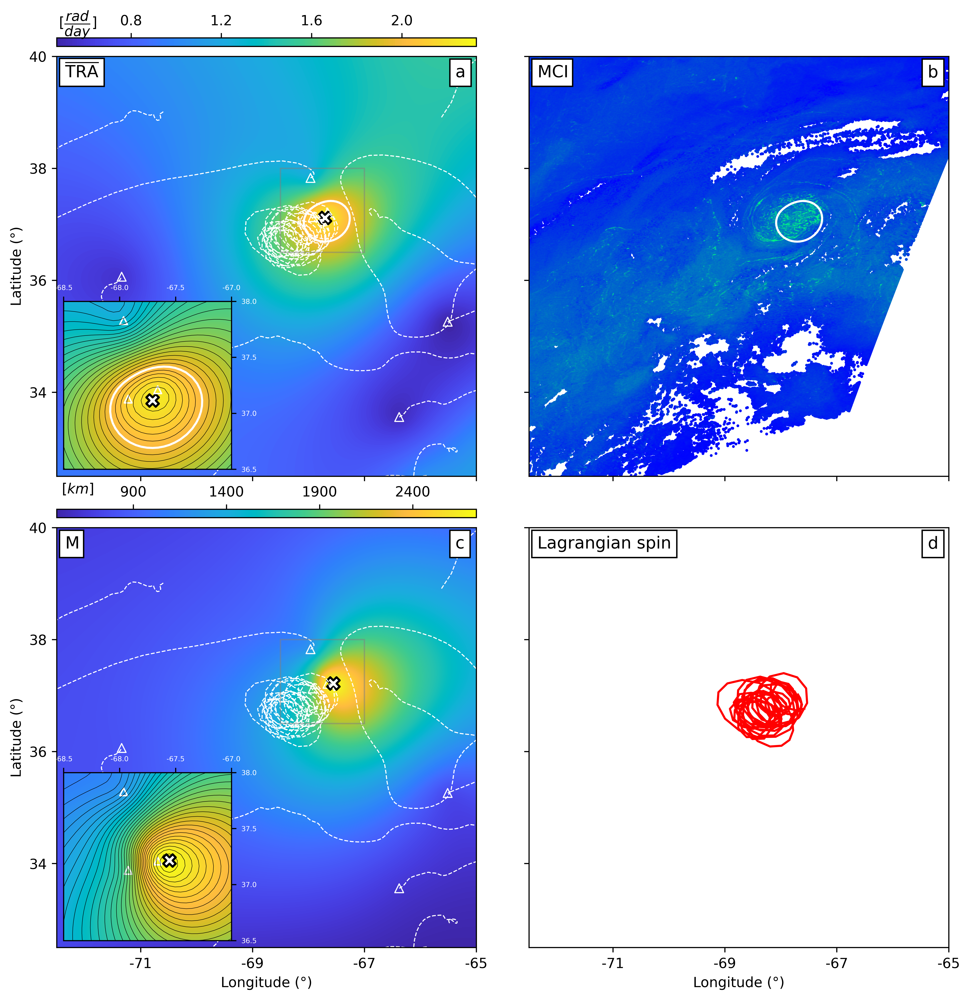

In [15]:
# Plot
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from matplotlib.ticker import FormatStrFormatter

from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset

filesave = r'./figures/fig7.jpeg'

# load LAVD data
from scipy.io import loadmat

from mpl_toolkits.axes_grid1 import make_axes_locatable

long_limits = [-72.5, -65]
lat_limits = [32.5, 40]

long_min = long_limits[0]
long_max = long_limits[1]
lat_min = lat_limits[0]
lat_max = lat_limits[1]

x1 = -68.5
x2 = -67
y1 = 36.5
y2 = 38

fig = plt.figure(figsize=(12, 12), dpi = 600)

########################## TRA ##########################

ax1 = plt.subplot(2, 2, 1) #PlateCarree
ax1.set_ylabel("Latitude (°)", fontsize = 10)

# Set ticks and limits
ax1.set_xticks(np.arange(long_min+1.5, long_max + 2, 2, dtype = int))
ax1.set_yticks(np.arange(lat_min+1.5, lat_max + 2, 2, dtype = int))

ax1.set_xticklabels([])
ax1.set_yticklabels(np.arange(lat_min+1.5, lat_max + 2, 2, dtype = int), fontsize = 10)

cax = ax1.contourf(X, Y, TRA_rbf, cmap = parula_map, levels= np.arange(np.min(TRA_rbf), np.max(TRA_rbf)+.1, 0.01),
                   zorder = -1)

#ax1.contour(X, Y, TRA_rbf, levels = 20, colors='k', linewidths = 0.3)
ax1.scatter(long_final, lat_final, s=40, marker="^", linewidth=.8, edgecolor='w', facecolor='None')

for ii in range(len(long)):
    ax1.plot(long[ii][-f*24*10:], lat[ii][-f*24*10:], linewidth = 0.75, linestyle = "dashed", c = "w")

# plot vortex boundaries from TRA
for idx_vertex in range(len(long_vortex)):
    ax1.plot(long_vortex[idx_vertex], lat_vortex[idx_vertex], linewidth = 1.5, c = "w")

ax1.scatter(peak_x_TRA, peak_y_TRA, s = 80, linewidths = 1.5, marker = "X", edgecolors = "k", facecolors = "w")

axins = zoomed_inset_axes(ax1, 2, loc=3) # zoom = 6
axins.contour(X, Y, TRA_rbf, levels = 50, colors='k', linewidths = 0.3)

axins.contourf(X, Y, TRA_rbf, cmap = parula_map, levels = np.arange(np.min(TRA_rbf), np.max(TRA_rbf)+.1, 0.01), zorder = -1)

for idx_vertex in range(len(long_vortex)):
    axins.plot(long_vortex[idx_vertex], lat_vortex[idx_vertex], linewidth = 1.5, c = "w")

axins.scatter(peak_x_TRA, peak_y_TRA, s = 80, linewidths = 1.5, marker = "X", edgecolors = "k", facecolors = "w")
axins.scatter(long_final, lat_final, s=30, marker="^", linewidth=1, edgecolor='w', facecolor='None')

# sub region of the original image
axins.set_xlim(x1, x2)
axins.set_ylim(y1, y2)

axins.set_xticks(np.arange(x1, x2+.1, .5))
axins.set_yticks(np.arange(y1, y2+.1, .5))

axins.yaxis.tick_right()
axins.xaxis.tick_top()
#axins.yaxis.set_ticks_position('both')

axins.set_xticklabels(axins.get_xticks(), fontsize = 5, c = "w")
axins.set_yticklabels(axins.get_yticks(), fontsize = 5, c = "w")

ax1.indicate_inset_zoom(axins)

# Define limits
ax1.set_xlim([long_min, long_max])
ax1.set_ylim([lat_min, lat_max])

divider = make_axes_locatable(ax1)
ax_cb = divider.new_vertical(size="2%", pad=0.1, axes_class=plt.Axes)

fig.add_axes(ax_cb)

# cbar TRA
cbar_ticks = np.arange(0.8, 2.4, 0.4)
cbar = plt.colorbar(cax, ax_cb, ticks = cbar_ticks, orientation="horizontal")
cbar.ax.set_xticklabels(np.around(cbar.get_ticks(),1), fontsize = 10)
cbar.ax.set_xlabel(r'$ [\dfrac{rad}{day}] $', rotation=0, x = 0.05, labelpad=-26, fontsize = 10)
cbar.ax.xaxis.set_ticks_position('top')

# Add letter
ax1.text(.95, .95, "a", c = "k", fontsize = 12, bbox = dict(facecolor='w', edgecolor='k'), transform = ax1.transAxes)
ax1.text(.02, .95, r'$ \mathrm{\overline{TRA}} $', c = "k", fontsize = 12, bbox = dict(facecolor='w', edgecolor='k'), transform = ax1.transAxes)

ax1.set_aspect('equal')

########################## Sargassum patch ##########################

ax2 = plt.subplot(2, 2, 2)

# Plot MCI
cax = ax2.scatter(x_Sargassum, y_Sargassum, c=Sargassum, cmap="winter", s=1, zorder=-1, norm=colors.PowerNorm(gamma=2))

# plot vortex boundaries from TRA
for idx_vertex in range(len(long_vortex)):
    ax2.plot(long_vortex[idx_vertex], lat_vortex[idx_vertex], linewidth = 1.5, c = "w")

# Set ticks and limits
ax2.set_xticks(np.arange(long_min+1.5, long_max + 2, 2, dtype = int))
ax2.set_yticks(np.arange(lat_min+1.5, lat_max + 2, 2, dtype = int))

# Set ticklabels
ax2.set_xticklabels([])
ax2.set_yticklabels([])

# Define limits
ax2.set_xlim([long_min, long_max])
ax2.set_ylim([lat_min, lat_max])

# Add axis for colorbar
divider = make_axes_locatable(ax2)
ax_cb = divider.new_vertical(size="2%", pad=0.1, axes_class=plt.Axes)
ax_cb.axis('off')
fig.add_axes(ax_cb)

# Cbar MCI
#cbar_ticks = [-0.6, -0.3, -0.1]
#cbar = plt.colorbar(cax, ax_cb, ticks = cbar_ticks, orientation="horizontal", aspect=50)
#cbar.ax.set_xlabel(r'$ (mW(m^2nmsr)^{-1}) $', rotation=0, x = 0.95, labelpad=-24, fontsize = 10)
#cbar.ax.set_xticklabels(np.around(cbar.get_ticks(), 1), fontsize = 10)
#cbar.ax.xaxis.set_major_formatter(FormatStrFormatter('%.1f'))
#cbar.ax.xaxis.set_ticks_position('top')

# Add letter
ax2.text(.95, .95, "b", c = "k", fontsize = 12, bbox = dict(facecolor='w', edgecolor='k'), transform = ax2.transAxes)
ax2.text(.02, .95, r'$ \mathrm{MCI} $', c = "k", fontsize = 12, bbox = dict(facecolor='w', edgecolor='k'), transform = ax2.transAxes)

# Set equal aspect ratio
ax2.set_aspect('equal')

########################## TRAJECTORY LENGTH ##########################

ax3 = plt.subplot(2, 2, 3)

# Plot trajectory length (=M-function)
cax = ax3.contourf(X, Y, Length_rbf, cmap = parula_map, levels = np.arange(np.min(Length_rbf), np.max(Length_rbf), 1),
                   zorder = -1)

# Plot drifters
ax3.scatter(long_final, lat_final, s=40, marker="^", linewidth=.8, edgecolor='w', facecolor='None')

# Plot drifter tails
for ii in range(len(long)):
    ax3.plot(long[ii][-f*24*10:], lat[ii][-f*24*10:], linewidth = 0.75, linestyle = "dashed", c = "w")

# Set labels
ax3.set_xlabel("Longitude (°)", fontsize = 10)
ax3.set_ylabel("Latitude (°)", fontsize = 10)

# Set ticks and limits
ax3.set_xticks(np.arange(long_min+1.5, long_max + 2, 2, dtype = int))
ax3.set_yticks(np.arange(lat_min+1.5, lat_max + 2, 2, dtype = int))

# Set ticklabels
ax3.set_xticklabels(ax3.get_xticks().astype(int), fontsize = 10)
ax3.set_yticklabels(ax3.get_yticks().astype(int), fontsize = 10)

# Plot peak of trajectory length (=M-function)
ax3.scatter(peak_x_M, peak_y_M, s = 80, linewidths = 1.5, marker = "X", edgecolors = "k", facecolors = "w")

# Define limits
ax3.set_xlim([long_min, long_max])
ax3.set_ylim([lat_min, lat_max])

# Add axis for colorbar
divider = make_axes_locatable(ax3)
ax_cb = divider.new_vertical(size="2%", pad=0.1, axes_class=plt.Axes)
fig.add_axes(ax_cb)

# cbar Trajectory Length
cbar_ticks = np.arange(900, 2800, 500, dtype = int)
cbar = plt.colorbar(cax, ax_cb, ticks = cbar_ticks, orientation="horizontal")
cbar.ax.set_xticklabels(np.around(cbar.get_ticks(),1), fontsize = 10)
cbar.ax.set_xlabel(r'$ [km] $', rotation=0, x = 0.05, labelpad=-25, fontsize = 10)
cbar.ax.xaxis.set_ticks_position('top')

# Add letter
ax3.text(.95, .95, "c", c = "k", fontsize = 12, bbox = dict(facecolor='w', edgecolor='k'), transform = ax3.transAxes)
ax3.text(.02, .95, r'$ \mathrm{M} $', c = "k", fontsize = 12, bbox = dict(facecolor='w', edgecolor='k'), transform = ax3.transAxes)

# Set equal aspect ratio
ax3.set_aspect('equal')

# Zoomed inset
axins = zoomed_inset_axes(ax3, 2, loc=3) # zoom = 6

# Plot level sets of trajectory length
axins.contour(X, Y, Length_rbf, levels = 50, colors='k', linewidths = 0.3)

# Plot trajectory length
axins.contourf(X, Y, Length_rbf, cmap = parula_map, levels = np.arange(np.min(Length_rbf), np.max(Length_rbf)+.1, 1), zorder = -1)

# Plot drifter positions
axins.scatter(long_final, lat_final, s=30, marker="^", linewidth=1, edgecolor='w', facecolor='None')

# Plot peak of trajectory length
axins.scatter(peak_x_M, peak_y_M, s = 80, linewidths = 1.5, marker = "X", edgecolors = "k", facecolors = "w")

# sub region of the original image
axins.set_xlim(x1, x2)
axins.set_ylim(y1, y2)

# Set ticks
axins.set_xticks(np.arange(x1, x2+.1, .5))
axins.set_yticks(np.arange(y1, y2+.1, .5))

# Set location of ticks
axins.yaxis.tick_right()
axins.xaxis.tick_top()

# Set ticklabels
axins.set_xticklabels(axins.get_xticks(), fontsize = 5, c = "w")
axins.set_yticklabels(axins.get_yticks(), fontsize = 5, c = "w")

# Make sure that inset is marked also in original figure
ax3.indicate_inset_zoom(axins)

########################## Loopers ##########################

ax4 = plt.subplot(2, 2, 4) #PlateCarree

# iterate over Loopers and plot
for loopers in Loopers:
    
    for i in range(len(loopers[0])):
        
        if loopers[2][i] > 0:
            
            colors = "r" # cyclonic
            
        else:
            
            colors = "b" # anticyclonic
            
        ax4.plot(loopers[0][i], loopers[1][i], c=colors, zorder = 1)
        
# Set ticks and limits
ax4.set_xticks(np.arange(long_min+1.5, long_max + 2, 2, dtype = int))
ax4.set_yticks(np.arange(lat_min+1.5, lat_max + 2, 2, dtype = int))

# Set ticklabels
ax4.set_xticklabels(ax4.get_xticks().astype(int), fontsize = 10)
ax4.set_yticklabels([], fontsize = 10)

# Set labels
ax4.set_xlabel("Longitude (°)", fontsize = 10)

# Define limits
ax4.set_xlim([long_min, long_max])
ax4.set_ylim([lat_min, lat_max])

# Add axes for colorbar
divider = make_axes_locatable(ax4)
ax_cb = divider.new_vertical(size="2%", pad=0.1, axes_class=plt.Axes)
ax_cb.axis('off')
fig.add_axes(ax_cb)

# Add letter
ax4.text(.95, .95, "d", c = "k", fontsize = 12, bbox = dict(facecolor='w', edgecolor='k'), transform = ax4.transAxes)
ax4.text(.02, .95, r'Lagrangian spin', c = "k", fontsize = 12, bbox = dict(facecolor='w', edgecolor='k'), transform = ax4.transAxes)

# Set equal aspect ratio
ax4.set_aspect('equal')

plt.subplots_adjust(wspace=0.025, hspace=0.075)

plt.savefig(filesave, dpi=600, bbox_inches='tight')
plt.show()